<a href="https://colab.research.google.com/github/astrocrazy/Data-Challenges/blob/master/data_challenge_DI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Scenario: A client has come to you with a data file containing workplace reviews by current and former employees. They want to understand more about the data they have but they don’t know what value they can derive from it. It’s your job to garner business value from the given information and pose the findings to the client.

Data Challenge as part of an interview process.

###Import Statements

In [0]:
from google.colab import files
import pandas as pd
import numpy as np
import pandas_profiling as pp
import re

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [0]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [0]:
import pandas_profiling as pp

In [0]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
from sklearn import metrics
from sklearn.metrics import confusion_matrix, roc_curve, auc,accuracy_score,classification_report,roc_auc_score

In [0]:
#to compare sentiments
from textblob import TextBlob
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
import string
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [0]:
%pip install pyLDAvis

     |████████████████████████████████| 1.6MB 2.9MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97711 sha256=48195390b45a0139c7f84604771cb7eac581059b079ce6482bb8330993844685
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [0]:
%pip install gensim

In [0]:
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
from gensim import corpora
from gensim.models import LdaModel, LdaMulticore
from gensim.utils import simple_preprocess, lemmatize
import gensim
import spacy
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

###Data Upload

In [0]:
files.upload()

Saving takehome-sample-2019-09-17.xlsx to takehome-sample-2019-09-17.xlsx


{'takehome-sample-2019-09-17.xlsx': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\x00\x00!\x00\xf4#\xce.\xc04\x0b\x00t\xdeT\x00\x18\x00\x00\x00xl/worksheets/sheet1.xml\x8c\xbd\xdd\xb2\xe4\xcau\xa4y?OA\xe3\xfd4\x0b\xff\x80LR[\xc7\x062O\x02\x08\xb3\xb1\xf9\xbbgKG-ZK\xa4\x8cd\xb7f\xde\xbe\x11\xbb\n*\xb8/w\xec\xbc;\xc7\xd7J\xd4\xca\xf4\x1d\x88\xf8"\x02\x81\xbf\xfd\xcf\xff\xdf\xbf\xfe\xcbo\xfe\xe7\xaf\x7f\xfe\xcb\x1f\xfe\xf4\xc7\xbf\xfbm\xf5\x9f\xbe\xfd\xf67\xbf\xfe\xf1\x1f\xfe\xf4\x8f\x7f\xf8\xe3\x7f\xfb\xbb\xdf\xfe?\xff\xf7\xe3\x7f\x1f\x7f\xfb\x9b\xbf\xfc\xf5\xf7\x7f\xfc\xc7\xdf\xff\xcb\x9f\xfe\xf8\xeb\xdf\xfd\xf6\xff\xff\xf5/\xbf\xfd\xcf\x7f\xff\xbf\xfd\xed\xbf\xff\xe9\xcf\xff\xfd/\xff\xfc\xeb\xaf\x7f\xfd\xcdq\x81?\xfe\xe5\xef~\xfb\xcf\x7f\xfd\xeb\xbf\xfd\xcd\xef~\xf7\x97\x7f\xf8\xe7_\xff\xf5\xf7\x7f\xf9O\x7f\xfa\xb7_\xffxD\xfe\xe9O\x7f\xfe\xd7\xdf\xff\xf5\xf8\xdf?\xff\xb7\xdf\xfd\xe5\xdf\xfe\xfc\xeb\xef\xff\xf1\xf3C\xff\xfa/\xbf\xab\xbf}\xeb\x7f\xf7\xaf\xbf\xff\xc3\x1f\x7f\xfb\xfd\n\x7f\xf3\xe7w

In [0]:
df = pd.read_excel("takehome-sample-2019-09-17.xlsx",index_col=0)

###EDA

In [0]:
df.head()

,Rating,Title,Body,Job Title,Location,Date,Rating - Job Work/Life Balance,Rating - Salary/Benefits,Rating - Job Security/Advancement,Rating - Management,Rating - Job Culture,Employment Status
0,4,Fast pace clean work environment that required...,I worked as a morning baker that prepared brea...,Baker,"Newmarket, ON",21 January 2019,4,2,3,5,4,Former Employee
1,5,Great workplace,"Fun serving guests everyday with a smile, most...",Food Counter Attendant,"Edmonton, AB",8 May 2019,0,0,0,0,0,Former Employee
2,5,Great Atmosphere,"Management is amazing, as well as my co-worker...",Team Member,"St. Catharines, ON",8 May 2019,5,5,5,5,5,Current Employee
3,1,Very Bad Place to Work,The Tim Horton's I worked at cut all benefits ...,Store Front,"Kitchener, ON",8 May 2019,1,1,1,1,1,Former Employee
4,4,fun fast paced,"Picky with scheduling, never got mon-fri as i ...",Baker,"Ottawa, ON",8 May 2019,3,3,5,3,4,Former Employee


In [0]:
pfr = pp.ProfileReport(df)
pfr.to_file("result.html")

##About the data:

**Business Value**
- contains reviews of work environment and work culture of Tim Hortons employees over a period of 7 years at different locations
- Has a review title and a review body. So can be treated as an NLP problem and do a sentiment analysis. This will help the organisation understand the employee satisfaction, which is directly linked with employee staying in the business. 
- With that information, we can try to predict a possibility of employee leaving beforehand and mitigate that scenario either by addressing their concerns or taking steps to avoid domino effect.
- An understanding of this data can also help to organise any employee specific marketing campaigns or team building excercises that will help HR with a higher retention rate.

**TO DO**:

- Find sentiments of the review title and review body and classify them into categories
- Use the sentiments to map out the employee satisfaction ratio at various locations and designations
- Find the employee retention rate at different sectors and identify any relationships between them
- Develop a predictive model to identify possible employee loss.
- If some sales data for the respective locations are available, it will interesting to model the sales based on the employee satisfaction and give positive reinforcements, to increase morale of the work environment. This analysis can augment usual sales predictions based on socio-economic conditions of the customers.

###EDA

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13020 entries, 0 to 13019
Data columns (total 15 columns):
Rating                               13020 non-null int64
Title                                13020 non-null object
Body                                 13020 non-null object
Job Title                            13020 non-null int64
Location                             13020 non-null int64
Date                                 13020 non-null object
Rating - Job Work/Life Balance       13020 non-null int64
Rating - Salary/Benefits             13020 non-null int64
Rating - Job Security/Advancement    13020 non-null int64
Rating - Management                  13020 non-null int64
Rating - Job Culture                 13020 non-null int64
Employment Status                    13020 non-null int64
tb_title_polarity                    13020 non-null float64
tb_body_polarity                     13020 non-null float64
sentiments                           13020 non-null category
dtypes: cat

In [0]:
df.describe()

,Rating,Rating - Job Work/Life Balance,Rating - Salary/Benefits,Rating - Job Security/Advancement,Rating - Management,Rating - Job Culture
count,13020.000000,13020.000000,13020.000000,13020.000000,13020.000000,13020.000000
mean,3.714363,3.336943,2.854301,3.082488,3.056682,3.260599
std,1.129686,1.514729,1.509084,1.559517,1.603202,1.568636
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000
50%,4.000000,4.000000,3.000000,3.000000,3.000000,4.000000
75%,5.000000,5.000000,4.000000,4.000000,4.000000,5.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [0]:
df = df.fillna(0)

In [0]:
#convert object to string type
df['Title'] = df['Title'].astype(str)
df['Employment Status'] = df['Employment Status'].astype(str)
df["Location"] = df["Location"].astype(str)
df['Job Title'] = df['Job Title'].astype(str)

In [0]:
#encode columns: Employment status, location and job title
df["Job Title"].unique()

array(['Baker', 'Food Counter Attendant', 'Team Member', ...,
       'team members', 'Cashier/Store Front/Delivery Truck Unloader',
       'Tim Hortons Cashier'], dtype=object)

Eventhough there are bound to be repetitions of the same Job Title, there are too many values to complete. So at this point, we are assuming they are all independent

In [0]:
le = LabelEncoder()

In [0]:
df['Job_title'] = le.fit_transform(df['Job Title'].values)

In [0]:
le.classes_

array(['"Front Cashier"', '# Cashier/Reception/Drive-thru',
       ', maintaining cash drawer, handling transactions,', ...,
       'ü Store front customer service', 'ǀ Food Counter Attendant',
       '❸ Customer service, fast pace environment'], dtype=object)

In [0]:
#Get the dictionary of classes
le_dict = {index: value for index, value in enumerate(le.classes_)}

In [0]:
[key for key in le_dict.keys() if (le_dict[key] == 'Nonetype')]

[]

In [0]:
df["Employment Status"].unique()

array(['Former Employee', 'Current Employee', 'part-time', 'Part-time',
       'Full-time', 'Oct\xa0(Current Employee', 'Assistant Manager',
       'Baker', ' Part Time ', "Membre d'équipe", 'QC', 'CO-OP',
       'Full Time', 'part time', '40hrs\\semaine', 'Part time',
       'Team member', 'GM', 'Part-Time', 'Superviseur',
       'CUSTOMER SERVICE', 'full-time', 'caissier,aide cuisinier',
       'Part Time', 'e', ' Food Server ', 'Part-time/Full-time',
       'Placement', 'baking, drive thru and store front', 'full time',
       'Full-time Shift Worker', '32 heures\xa0(Current Employee', '0',
       'PART TIME', 'helper', 'Contract', 'Cashier', 'Midnights/Baker',
       "membre d'équipe", 'Night Shift', 'current', '2016', 'PT', 'BAKER',
       'midnights', 'assist-gérante', 'Seasonal', 'p/t', 'P/T',
       'All Around', 'Supply Chain Division', 'Supervisor on weekends',
       'Supervisor', 'closer', 'boulanger', 'Full time Trainer ',
       'Customer Service', 'Baker, Calibration', '

There are some repetitions in the label. So remove them before proceeding

In [0]:
df["Employment Status"].replace(["Part time","Part-Time"," Part Time ", " Part Time","PART TIME","part-time","Part-time","PT","p/t","P/T","part time"],"Part Time",inplace=True)
df["Employment Status"].replace(["Full-time","full-time","full time"],"Full Time",inplace=True)
df["Employment Status"].replace(["boulanger","BAKER"],"Baker",inplace=True)
df["Employment Status"].replace(["CUSTOMER SERVICE"],"Customer Service", inplace=True)
df["Employment Status"].replace(["Membre d'équipe","membre d'équipe","Team member"],"Team Member",inplace=True)
df["Employment Status"].replace(["Oct\xa0(Current Employee","current"],"Current Employee",inplace=True)
df["Employment Status"].replace(["tout","AL"],"All Around",inplace = True)
df["Employment Status"].replace(["storefront","front","Storefront"],"store front",inplace=True)
df["Employment Status"].replace(["assist-gérante"],"Assistant Manager",inplace=True)

In [0]:
df["Employment Status"].unique()

array(['Former Employee', 'Current Employee', 'Part Time', 'Full Time',
       'Assistant Manager', 'Baker', 'Team Member', 'QC', 'CO-OP',
       '40hrs\\semaine', 'GM', 'Superviseur', 'Customer Service',
       'caissier,aide cuisinier', 'e', ' Food Server ',
       'Part-time/Full-time', 'Placement',
       'baking, drive thru and store front', 'Full-time Shift Worker',
       '32 heures\xa0(Current Employee', '0', 'helper', 'Contract',
       'Cashier', 'Midnights/Baker', 'Night Shift', '2016', 'midnights',
       'Seasonal', 'All Around', 'Supply Chain Division',
       'Supervisor on weekends', 'Supervisor', 'closer',
       'Full time Trainer ', 'Baker, Calibration', 'senior crew', 'stage',
       'store front', ' tout ', 'Lachine', 'Third-shift',
       'Nighttime shift supervisor', 'Trainer'], dtype=object)

In [0]:
le1 = LabelEncoder()

In [0]:
df["Employment_status"]=le1.fit_transform(df['Employment Status'].values)

In [0]:
#Get the dictionary of classes
le1_dict = {index: value for index, value in enumerate(le1.classes_)}

In [0]:
df["Location"].unique()

array(['Newmarket, ON', 'Edmonton, AB', 'St. Catharines, ON', ...,
       'Saint-Antoine, QC', 'Pawtucket, RI', 'Cheticamp, NS'],
      dtype=object)

Assume all locations are unique and independent

In [0]:
le2 = LabelEncoder()

In [0]:
df["location"]=le2.fit_transform(df['Location'].values)

In [0]:
le2.classes_

array([', AB', ', BC', ', CA', ..., 'Youngstown, OH', 'Ypsilanti, MI',
       'Zanesville, OH'], dtype=object)

In [0]:
#Get the dictionary of classes
le2_dict = {index: value for index, value in enumerate(le2.classes_)}

To Do: Can try some sort of fuzzy matching to find indentical pairs and remove them, before encoding

In [0]:
df.head()

,Rating,Title,Body,Job Title,Location,Date,Rating - Job Work/Life Balance,Rating - Salary/Benefits,Rating - Job Security/Advancement,Rating - Management,Rating - Job Culture,Employment Status,Job_title,Employment_status,location
0,4,Fast pace clean work environment that required...,I worked as a morning baker that prepared brea...,Baker,"Newmarket, ON",21 January 2019,4,2,3,5,4,Former Employee,118,19,826
1,5,Great workplace,"Fun serving guests everyday with a smile, most...",Food Counter Attendant,"Edmonton, AB",8 May 2019,0,0,0,0,0,Former Employee,1385,19,382
2,5,Great Atmosphere,"Management is amazing, as well as my co-worker...",Team Member,"St. Catharines, ON",8 May 2019,5,5,5,5,5,Current Employee,2803,17,1190
3,1,Very Bad Place to Work,The Tim Horton's I worked at cut all benefits ...,Store Front,"Kitchener, ON",8 May 2019,1,1,1,1,1,Former Employee,2407,19,623
4,4,fun fast paced,"Picky with scheduling, never got mon-fri as i ...",Baker,"Ottawa, ON",8 May 2019,3,3,5,3,4,Former Employee,118,19,897


###Sentiment Analysis

In [0]:
#give sentiment scores to the title and body
df['title_polarity'] =  df['Title'].map(lambda text: TextBlob(text).sentiment.polarity)
df['body_polarity'] =  df['Body'].map(lambda text: TextBlob(text).sentiment.polarity)

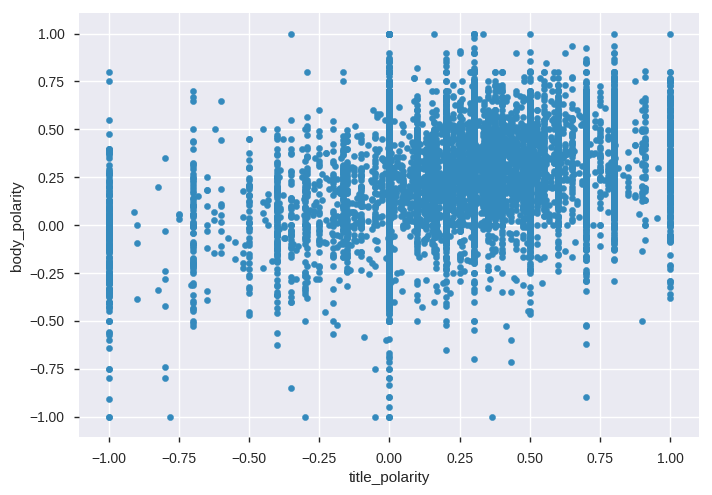

In [0]:
df.plot.scatter(x="title_polarity",y="body_polarity",)

In [0]:
df["title_polarity"].corr(df["body_polarity"])

0.3450598268038368

As expected the two polarity is midly positively correlated. So we can use the body, since it contains more information, due to it being a longer text.

Let us split the body polarity, into 3 categories -1,0,1 named as Negative, Neutral and Positive. It is important to know not just the positive and negative sentiments but also the neutral sentiments. This gives us a group of people who apparantly have no opinion. So this group of people could be a target for future surveys, thus giving a wholistic picture

(array([  16.,   20.,   86.,  281.,  877., 4028., 4706., 2347.,  534.,
         125.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 10 Patch objects>)

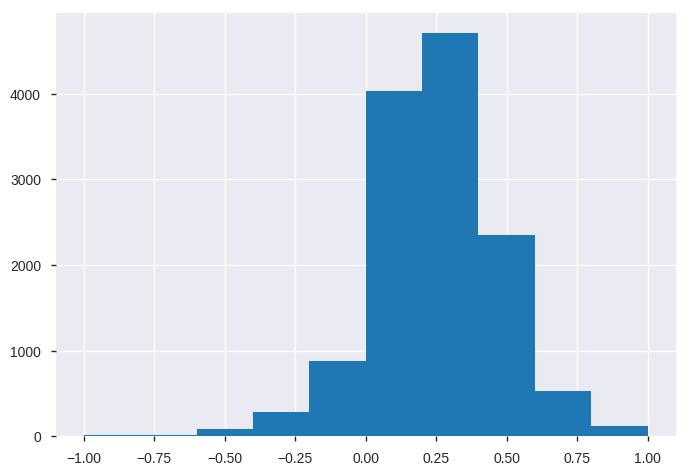

In [0]:
fig, ax = plt.subplots()
ax.hist(df['body_polarity'])

This is a distribution centered around 0.4. However, to get the information about neutral sentiments, we are dividing the distribution at -0.2 and 0.2 as follows. Even though it results in a skewed distribution, this bias is inherent in the data, **i.e, the employees are in general are very positive towards their working environment**

In [0]:
df["sentiments"] = pd.cut(df.body_polarity,bins=[-1.,-0.2,0.2,1],labels=[-1,0,1])

###Topic Model

Lets have a look at the words that are commonly used in the different sentiments. This will give an idea about particular concerns or appreciations that the employees will have

In [0]:
df_pos = df[df["sentiments"] == 1]
df_neg = df[df["sentiments"] == -1]
df_neu = df[df["sentiments"] == 0]

Lets look at the positive reviews:

In [0]:
pos_text = df_pos.Body

In [0]:
pos_text.describe()

count                                                  7730
unique                                                 7721
top       A typical work day was great, I learned about ...
freq                                                      2
Name: Body, dtype: object

Lets find the top 4 topics that are present using LDA

In [0]:
stop_words = stopwords.words('english')

####Utility Functions

In [0]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

In [0]:
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

In [0]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [0]:
def text2corpus(text): 
  #convert string to word tokens
  texts = list(sent_to_words(text))
  #lemmatize the word tokens
  texts_lemmatized = lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])
  # Create dictionary; expects array as input
  dct = corpora.Dictionary(texts_lemmatized)
  #filter extreme words
  dct.filter_extremes(no_below=10, no_above=0.2)
  #creating my corpus
  mycorpus = [dct.doc2bow(doc, allow_update=True) for doc in texts_lemmatized]
  
  return mycorpus

####Modelling

In [0]:
#simple LDA model with basic parameters and 4 topics
lda_model = LdaMulticore(corpus=mycorpus,
                         id2word=dct,
                         random_state=100,
                         num_topics=4,
                         passes=10,
                         chunksize=1000,
                         batch=False,
                         alpha='asymmetric',
                         decay=0.5,
                         offset=64,
                         eta=None,
                         eval_every=0,
                         iterations=100,
                         gamma_threshold=0.001,
                         per_word_topics=True)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [0]:
# save the model
lda_model.save('lda_model.model')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [0]:
for c in lda_model[mycorpus[5:9]]:
    print("Document Topics      : ", c[0])      # [(Topics, Perc Contrib)]
    print("Word id, Topics      : ", c[1][:3])  # [(Word id, [Topics])]
    print("Phi Values (word id) : ", c[2][:2])  # [(Word id, [(Topic, Phi Value)])]
    print("Word, Topics         : ", [(dct[wd], topic) for wd, topic in c[1][:2]])   # [(Word, [Topics])]
    print("Phi Values (word)    : ", [(dct[wd], topic) for wd, topic in c[2][:2]])  # [(Word, [(Topic, Phi Value)])]
    print("------------------------------------------------------\n")

Document Topics      :  [(0, 0.084876336), (1, 0.0138099985), (2, 0.893507)]
Word id, Topics      :  [(4, [2]), (43, [2]), (54, [2])]
Phi Values (word id) :  [(4, [(2, 0.9994986)]), (43, [(2, 0.99935746)])]
Word, Topics         :  [('environment', [2]), ('often', [2])]
Phi Values (word)    :  [('environment', [(2, 0.9994986)]), ('often', [(2, 0.99935746)])]
------------------------------------------------------

Document Topics      :  [(0, 0.012235971), (2, 0.9748734)]
Word id, Topics      :  [(20, [2]), (52, [2]), (67, [2])]
Phi Values (word id) :  [(20, [(2, 0.9993924)]), (52, [(2, 0.9997664)])]
Word, Topics         :  [('help', [2]), ('hour', [2])]
Phi Values (word)    :  [('help', [(2, 0.9993924)]), ('hour', [(2, 0.9997664)])]
------------------------------------------------------

Document Topics      :  [(0, 0.024158869), (1, 0.015023434), (2, 0.95215935)]
Word id, Topics      :  [(18, [2]), (38, [2]), (51, [2])]
Phi Values (word id) :  [(18, [(2, 0.9986368)]), (38, [(2, 0.99933

The postive reviews contains the words "help, fun, environment, workplace, often". So it makes us conclude that the work enviroment makes the most positive impact on an employee.

Lets do the same analysis for neg words.

In [0]:
neg_text = df_neg.Body

In [0]:
neg_text.describe()

count                                                   391
unique                                                  391
top       Personally I found that my job itself was not ...
freq                                                      1
Name: Body, dtype: object

In [0]:
mycorpus_neg = text2corpus(neg_text)

In [0]:
#simple LDA model with basic parameters and 4 topics
lda_model = LdaMulticore(corpus=mycorpus_neg,
                         id2word=dct,
                         random_state=100,
                         num_topics=4,
                         passes=10,
                         chunksize=1000,
                         batch=False,
                         alpha='asymmetric',
                         decay=0.5,
                         offset=64,
                         eta=None,
                         eval_every=0,
                         iterations=100,
                         gamma_threshold=0.001,
                         per_word_topics=True)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [0]:
# save the model
lda_model.save('lda_model.model')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [0]:
for c in lda_model[mycorpus_neg[5:9]]:
    print("Document Topics      : ", c[0])      # [(Topics, Perc Contrib)]
    print("Word id, Topics      : ", c[1][:3])  # [(Word id, [Topics])]
    print("Phi Values (word id) : ", c[2][:2])  # [(Word id, [(Topic, Phi Value)])]
    print("Word, Topics         : ", [(dct[wd], topic) for wd, topic in c[1][:2]])   # [(Word, [Topics])]
    print("Phi Values (word)    : ", [(dct[wd], topic) for wd, topic in c[2][:2]])  # [(Word, [(Topic, Phi Value)])]
    print("------------------------------------------------------\n")

Document Topics      :  [(0, 0.97080785), (1, 0.012468115)]
Word id, Topics      :  [(11, [0]), (34, [0]), (40, [0])]
Phi Values (word id) :  [(11, [(0, 0.99992836)]), (34, [(0, 0.9999784)])]
Word, Topics         :  [('require', [0]), ('safe', [0])]
Phi Values (word)    :  [('require', [(0, 0.99992836)]), ('safe', [(0, 0.9999784)])]
------------------------------------------------------

Document Topics      :  [(0, 0.98137003)]
Word id, Topics      :  [(14, [0]), (25, [0]), (45, [0])]
Phi Values (word id) :  [(14, [(0, 0.9999608)]), (25, [(0, 0.99996406)])]
Word, Topics         :  [('doesn', [0]), ('serve', [0])]
Phi Values (word)    :  [('doesn', [(0, 0.9999608)]), ('serve', [(0, 0.99996406)])]
------------------------------------------------------

Document Topics      :  [(0, 0.9944807)]
Word id, Topics      :  [(0, [0]), (3, [0]), (4, [0])]
Phi Values (word id) :  [(0, [(0, 0.9999865)]), (3, [(0, 0.9999914)])]
Word, Topics         :  [('accuracy', [0]), ('clean', [0])]
Phi Values 

The topics that were identified were "require, safe, accuracy, clean, supportive, environment", clearly indicating, that employee training will improve the overall satisfaction of the employees.

Now lets convert the dates, to a datetime object and calculate the time frame of this observation set

In [0]:
df_temp = df# a backup copy

In [0]:
df["Date"] = pd.to_datetime(df["Date"])

In [0]:
#Lets drop the not needed columns
df_cl = df.drop(["Title","Body","body_polarity","title_polarity","Job Title","Location","Employment Status"],axis=1)

In [0]:
diff = (df_cl.Date.max()- df_cl.Date.min()).days

In [0]:
years = (divmod(diff,365))[0]
days = (divmod(diff,365))[1]
print("There is data for a time period of ",years, " years and ", days," days.")

There is data for a time period of  7  years and  80  days.


In [0]:
df_cl.head()

,Rating,Date,Rating - Job Work/Life Balance,Rating - Salary/Benefits,Rating - Job Security/Advancement,Rating - Management,Rating - Job Culture,Job_title,Employment_status,location,sentiments
0,4,2019-01-21,4,2,3,5,4,118,19,826,1
1,5,2019-05-08,0,0,0,0,0,1385,19,382,1
2,5,2019-05-08,5,5,5,5,5,2803,17,1190,1
3,1,2019-05-08,1,1,1,1,1,2407,19,623,0
4,4,2019-05-08,3,3,5,3,4,118,19,897,0


In [0]:
df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13020 entries, 0 to 13019
Data columns (total 11 columns):
Rating                               13020 non-null int64
Job Title                            13020 non-null int64
Location                             13020 non-null int64
Date                                 13020 non-null datetime64[ns]
Rating - Job Work/Life Balance       13020 non-null int64
Rating - Salary/Benefits             13020 non-null int64
Rating - Job Security/Advancement    13020 non-null int64
Rating - Management                  13020 non-null int64
Rating - Job Culture                 13020 non-null int64
Employment Status                    13020 non-null int64
sentiments                           13011 non-null category
dtypes: category(1), datetime64[ns](1), int64(9)
memory usage: 1.7 MB


Lets understand the relationship between the sentiment and the different groups, in terms of job location, employment status, job title and also, if the satisfaction changed with time.

In [0]:
df_cl["Rating"].mean()

3.714362519201229

The mean rating across various locations is 3.4

####Relationship Plots

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


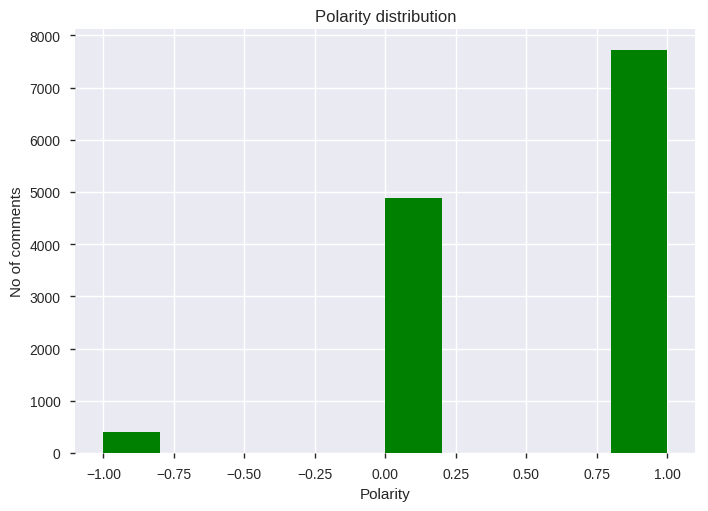

In [0]:
fig, ax = plt.subplots()
ax.hist(df_cl['sentiments'],color='green')
ax.set_xlabel('Polarity')
ax.set_ylabel('No of comments')
ax.set_title('Polarity distribution')
fig.show()

Text(0.5, 1.0, 'Distribution of Rating by location')

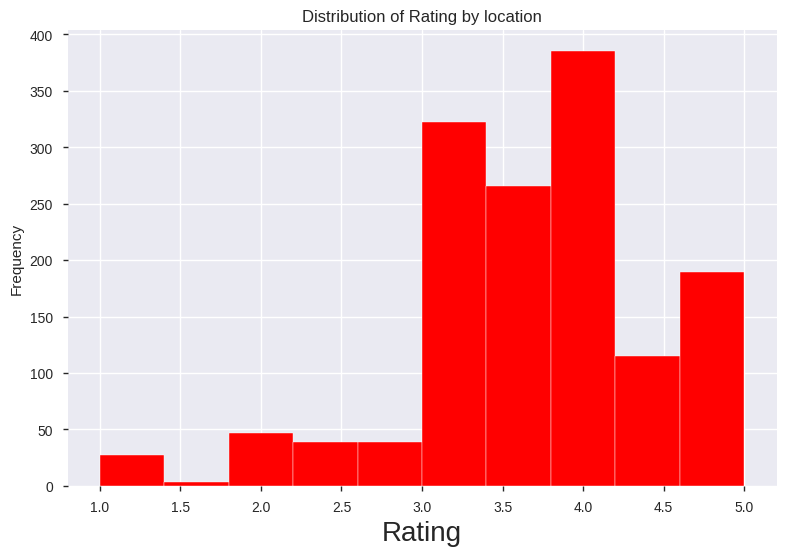

In [0]:
df_cl.groupby("location")["Rating"].mean().plot.hist(stacked=True,color="Red",ec="white")

plt.xlabel('Rating',fontsize=20)
plt.tight_layout()
plt.title("Distribution of Rating by location")


From the above plot, we find that the average is around 3.5, there are some locations which are definitely not doing well. 

Text(0.5, 0, 'Encoded Location Classes')

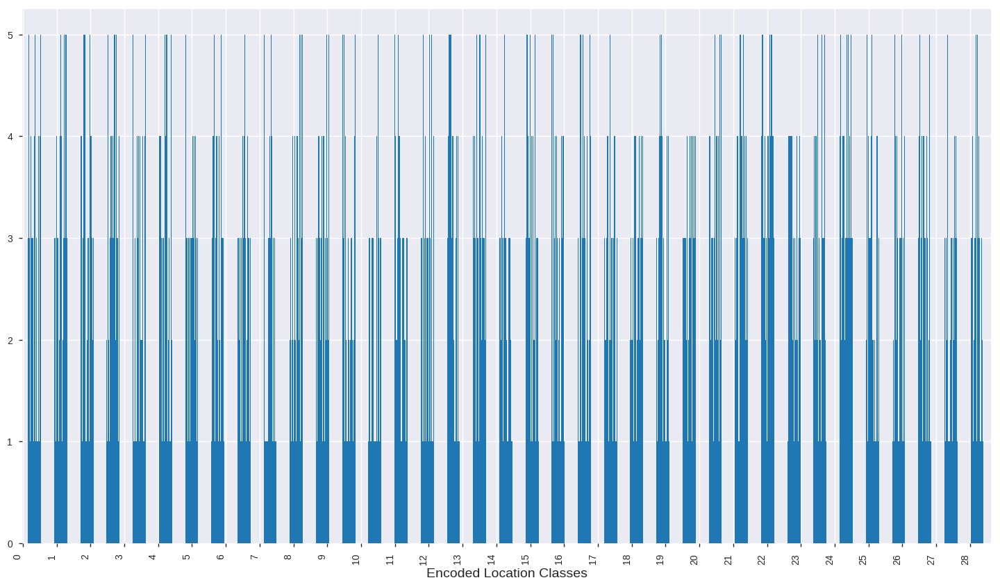

In [0]:
plt.figure(figsize=(18,10))
df_cl.groupby("location")["Rating"].min().plot.bar()
plt.xticks(rotation=90, ha='right')
plt.xticks(np.arange(0, 1433, 50))
plt.xlabel("Encoded Location Classes", fontsize=14)

Text(0.5, 1.0, 'Distribution of Rating at different tiers of organisation')

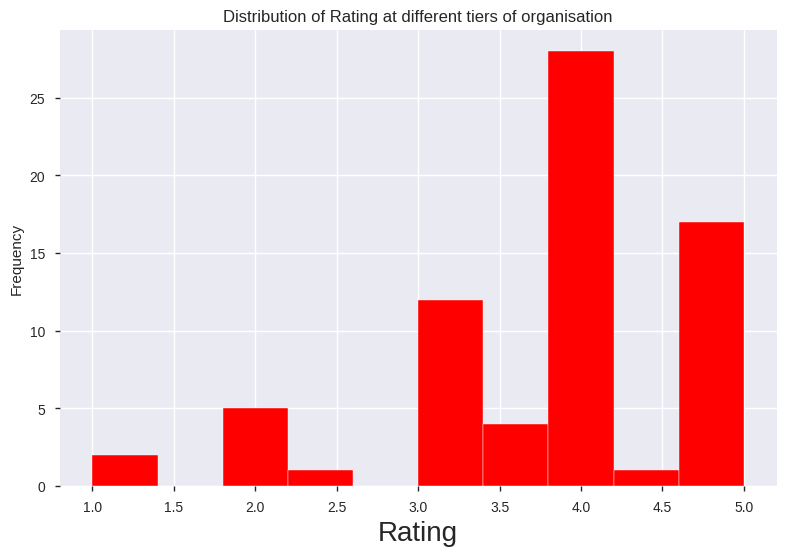

In [0]:
df_cl.groupby("Employment_status")["Rating"].mean().plot.hist(stacked=True,color="Red",ec="white")

plt.xlabel('Rating',fontsize=20)
plt.tight_layout()
plt.title("Distribution of Rating at different tiers of organisation")

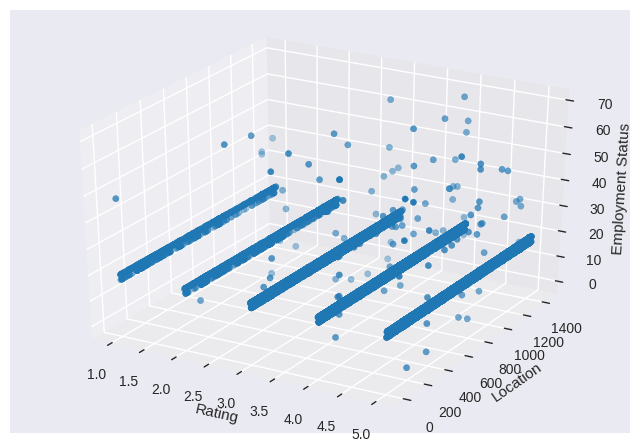

In [0]:
from mpl_toolkits.mplot3d import Axes3D
threedee = plt.figure().gca(projection='3d')
threedee.scatter(df_cl["Rating"],df_cl["location"], df_cl["Employment_status"])
threedee.set_xlabel('Rating')
threedee.set_ylabel('Location')
threedee.set_zlabel('Employment Status')
plt.show()

An interesting observation is the absence of significant deviation between different employee status or location. The ratings seem to be uniformly distributed within the global distribution.

A key takeaway from the above plot is that, the data has been collected from a particular set of employees or designations or this particular business employs this group (between classes 10 and 20) in large numbers. This is a bias in the data.

###Retention Rate

It is important for any business to know their employee retention rate. 
This is given by the percentage of employees who left in a particular period. Since we have data for more than 7 years, lets calculate the trend in retention rate. 

In [0]:
df_rr = df_cl.copy()# lets work on a copy of the cleaned dataframe

Create a new column based on the employee status.

0 -  still working
1 -  left ("Former Employee" = label 15 after label encoder)

In [0]:
le1_dict

{0: ' Food Server ',
 1: ' tout ',
 2: '0',
 3: '2016',
 4: '32 heures\xa0(Current Employee',
 5: '40hrs\\semaine',
 6: 'All Around',
 7: 'Assistant Manager',
 8: 'Baker',
 9: 'Baker, Calibration',
 10: 'CO-OP',
 11: 'Cashier',
 12: 'Contract',
 13: 'Current Employee',
 14: 'Customer Service',
 15: 'Former Employee',
 16: 'Full Time',
 17: 'Full time Trainer ',
 18: 'Full-time Shift Worker',
 19: 'GM',
 20: 'Lachine',
 21: 'Midnights/Baker',
 22: 'Night Shift',
 23: 'Nighttime shift supervisor',
 24: 'Part Time',
 25: 'Part-time/Full-time',
 26: 'Placement',
 27: 'QC',
 28: 'Seasonal',
 29: 'Superviseur',
 30: 'Supervisor',
 31: 'Supervisor on weekends',
 32: 'Supply Chain Division',
 33: 'Team Member',
 34: 'Third-shift',
 35: 'Trainer',
 36: 'baking, drive thru and store front',
 37: 'caissier,aide cuisinier',
 38: 'closer',
 39: 'e',
 40: 'helper',
 41: 'midnights',
 42: 'senior crew',
 43: 'stage',
 44: 'store front'}

In [0]:
df_rr["left"]=0

In [0]:
df_rr["left"][df["Employment_status"] == 15] = 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [0]:
idx = np.where(df_rr.Employment_status == 15)

In [0]:
df_rr.iloc[idx]

,Rating,Date,Rating - Job Work/Life Balance,Rating - Salary/Benefits,Rating - Job Security/Advancement,Rating - Management,Rating - Job Culture,Job_title,Employment_status,location,sentiments,left
7389,4,2016-12-01,0,0,0,0,0,1424,15,195,1,1
9712,4,2015-08-07,3,2,2,4,4,1085,15,1410,1,1


Before going any further, it is noticed that there is only information about 2 employees leaving. Hence, this is not enough to carry on the analysis towards a churn/turnover probability prediction.

###Conclusion

Business Value Conclusions

- Across the 1432 locations and various tiers of this business, the employee is moderately satisfied with an average rating of 3.7. 
- This gives room for the organisation to improve the employee satisfaction by addressing their concerns as well as directing specific marketing campaigns for the employees.
- There was a clear concern for the safe and clean environment, as was evidenced by the negative reviews received. This could be an indication of further training needed by the employees, in terms of handling of work place, safety of workplace, etc. 



Future Recommendations:

- Develop a predictive model to identify possible employee loss.
- If some sales data for the respective locations are available, it will interesting to model the sales based on the employee satisfaction and give positive reinforcements, to increase morale of the work environment. This analysis can augment usual sales predictions based on socio-economic conditions of the customers.